In [3]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torch
import torchvision.models as models
import torchvision.transforms as transforms


In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
# Adjust this path to where your dataset is on Drive
!unzip /content/drive/MyDrive/FID/FID-300.zip
DATA_DIR = '/content/FID-300'
REFERENCES_DIR = os.path.join(DATA_DIR, 'references')
PROBES_DIR = os.path.join(DATA_DIR, 'tracks_cropped')
LABELS_CSV = os.path.join(DATA_DIR, 'label_table.csv')

label_df = pd.read_csv(LABELS_CSV,dtype=str)
label_df.columns = ['probe_name', 'reference_name']
print(f"Number of samples: {len(label_df)}")
label_df.head()


Archive:  /content/drive/MyDrive/FID/FID-300.zip
   creating: FID-300/
  inflating: FID-300/README.txt      
  inflating: FID-300/subsetTable_170_in_300.mat  
  inflating: FID-300/result_ACCV14.mat  
  inflating: FID-300/label_table.csv  
 extracting: FID-300/label_table.mat  
   creating: FID-300/tracks_original/
  inflating: FID-300/tracks_original/00128.jpg  
  inflating: FID-300/tracks_original/00127.jpg  
  inflating: FID-300/tracks_original/00126.jpg  
  inflating: FID-300/tracks_original/00125.jpg  
  inflating: FID-300/tracks_original/00124.jpg  
  inflating: FID-300/tracks_original/00123.jpg  
  inflating: FID-300/tracks_original/00122.jpg  
  inflating: FID-300/tracks_original/00121.jpg  
  inflating: FID-300/tracks_original/00120.jpg  
  inflating: FID-300/tracks_original/00119.jpg  
  inflating: FID-300/tracks_original/00118.jpg  
  inflating: FID-300/tracks_original/00117.jpg  
  inflating: FID-300/tracks_original/00116.jpg  
  inflating: FID-300/tracks_original/00115.jpg 

,probe_name,reference_name
0,2,14
1,3,1052
2,4,1078
3,5,63
4,6,11


In [6]:
def show_pair(probe_img_name, ref_img_name):
    probe_path = os.path.join(PROBES_DIR, probe_img_name)
    ref_path = os.path.join(REFERENCES_DIR, ref_img_name)

    probe_img = cv2.imread(probe_path, cv2.IMREAD_GRAYSCALE)
    ref_img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)

    # تحقق إن الصور اتحملت فعلاً
    if probe_img is None:
        print(f" Failed to load probe image: {probe_path}")
        return
    if ref_img is None:
        print(f" Failed to load reference image: {ref_path}")
        return

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(probe_img, cmap='gray')
    plt.title('Probe Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(ref_img, cmap='gray')
    plt.title('Reference Image')
    plt.axis('off')
    plt.show()


In [7]:


label_df = pd.read_csv(LABELS_CSV, dtype=str)
label_df.columns = ['probe_name', 'reference_name']


# نضيف leading zeros لكل اسم → الصور كلها 6 أرقام مثل 000002.png
label_df['probe_name'] = label_df['probe_name'].apply(lambda x: f"{int(x):05}.jpg")
label_df['reference_name'] = label_df['reference_name'].apply(lambda x: f"{int(x):05}.png")


In [8]:
label_df.head()

,probe_name,reference_name
0,00002.jpg,00014.png
1,00003.jpg,01052.png
2,00004.jpg,01078.png
3,00005.jpg,00063.png
4,00006.jpg,00011.png


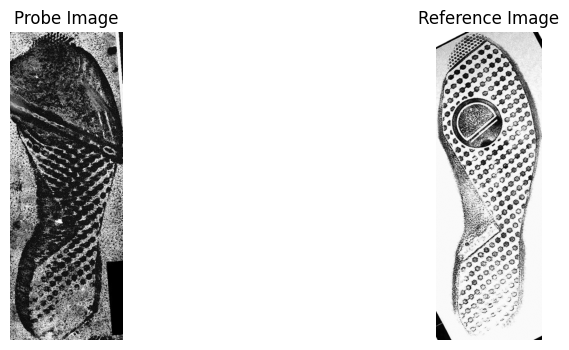

In [9]:
show_pair(label_df.iloc[0]['probe_name'], label_df.iloc[0]['reference_name'])

In [15]:
# تثبيت وتحميل البيانات من Google Drive
!unzip /content/drive/MyDrive/FID/FID-300.zip -d /content/



# المكتبات الأساسية
import os
import cv2
import pandas as pd
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms

# ---------------- CONFIG ----------------
DATA_DIR = '/content/FID-300'
REFERENCES_DIR = os.path.join(DATA_DIR, 'references')
PROBES_DIR = os.path.join(DATA_DIR, 'tracks_cropped')
LABELS_CSV = os.path.join(DATA_DIR, 'label_table.csv')
IMG_SIZE = 224
BATCH_SIZE = 16

# ---------------- Load CSV and Prepare Labels ----------------
label_df = pd.read_csv(LABELS_CSV, dtype=str)
label_df.columns = ['probe_name', 'reference_name']

# تأكد من تنسيق الأسماء لتكون 000001.jpg / 000001.png
label_df['probe_name'] = label_df['probe_name'].apply(lambda x: os.path.join(PROBES_DIR, f"{int(x):05}.jpg"))
label_df['reference_name'] = label_df['reference_name'].apply(lambda x: os.path.join(REFERENCES_DIR, f"{int(x):05}.png"))

# ---------------- Visualize Pair ----------------
def show_pair(probe_path, ref_path):
    probe_img = cv2.imread(probe_path, cv2.IMREAD_GRAYSCALE)
    ref_img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)

    if probe_img is None or ref_img is None:
        print("Error: Failed to load one of the images.")
        return

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(probe_img, cmap='gray')
    plt.title('Probe Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(ref_img, cmap='gray')
    plt.title('Reference Image')
    plt.axis('off')
    plt.show()

# show_pair(label_df.iloc[0]['probe_name'], label_df.iloc[0]['reference_name'])



# ---------------- Image Preprocessing ----------------
def is_valid_image(img_path):
    """تحقق من وجود الصورة وكونها ملفًا صالحًا"""
    return os.path.exists(img_path) and os.path.isfile(img_path)

def preprocess_image(img_path):
    """معالجة الصورة"""
    if not is_valid_image(img_path):
        print(f"Invalid image path: {img_path}")
        return Image.fromarray(np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8))

    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Failed to load image: {img_path}")
        return Image.fromarray(np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8))

    img = cv2.equalizeHist(img)
    img = cv2.GaussianBlur(img, (5, 5), 0)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1)
    sobel = cv2.magnitude(sobelx, sobely)
    sobel = np.uint8(np.clip(sobel, 0, 255))
    _, binary = cv2.threshold(sobel, 50, 255, cv2.THRESH_BINARY)
    binary = cv2.resize(binary, (IMG_SIZE, IMG_SIZE))
    return Image.fromarray(binary)

# ---------------- Create Positive & Negative Pairs ----------------
def create_pairs(label_df, num_negatives=1):
    """إنشاء أزواج إيجابية وسلبية"""
    pairs = []
    reference_names = set(label_df['reference_name'].tolist())

    for _, row in label_df.iterrows():
        probe = row['probe_name']
        ref_pos = row['reference_name']

        # تحقق من صحة مسارات الصور قبل إضافتها
        if not is_valid_image(probe) or not is_valid_image(ref_pos):
            print(f"Skipping invalid pair: {probe}, {ref_pos}")
            continue  # إذا كانت الصورة غير موجودة، نتخطى هذا الزوج

        pairs.append((probe, ref_pos, 1))  # Positive

        for _ in range(num_negatives):
            ref_neg = ref_pos
            while ref_neg == ref_pos:
                ref_neg = random.choice(list(reference_names))
            if not is_valid_image(ref_neg):
                print(f"Skipping invalid reference image: {ref_neg}")
                continue  # إذا كانت الصورة غير موجودة، نتخطى هذا الزوج السالب
            pairs.append((probe, ref_neg, 0))  # Negative

    return pairs

pairs = create_pairs(label_df, num_negatives=15)
print(f"Total pairs: {len(pairs)}")

# ---------------- Dataset ----------------
class TripletFootwearDataset(Dataset):
    def __init__(self, label_df, transform=None):
        self.label_df = label_df
        self.transform = transform
        self.ref_list = list(set(label_df['reference_name']))

    def __len__(self):
        return len(self.label_df)

    def __getitem__(self, idx):
        anchor_path = self.label_df.iloc[idx]['probe_name']
        positive_path = self.label_df.iloc[idx]['reference_name']
        negative_path = positive_path
        while negative_path == positive_path:
            negative_path = random.choice(self.ref_list)

        # تحقق من صحة مسارات الصور قبل تحميلها
        if not is_valid_image(anchor_path) or not is_valid_image(positive_path) or not is_valid_image(negative_path):
            print(f"Skipping invalid pair: {anchor_path}, {positive_path}, {negative_path}")
            return None  # العودة إلى None إذا كانت الصور غير صالحة

        anchor = preprocess_image(anchor_path)
        positive = preprocess_image(positive_path)
        negative = preprocess_image(negative_path)

        if self.transform:
            anchor = self.transform(anchor)
            positive = self.transform(positive)
            negative = self.transform(negative)

        return anchor, positive, negative



import torch.nn.functional as F

# ---------- Model (normalized output + triplet loss) ----------
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        base = models.resnet18(pretrained=True)
        base.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        base.fc = nn.Identity()
        self.encoder = base
        self.fc = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 64)
        )

    def forward_one(self, x):
        x = self.encoder(x)
        x = self.fc(x)
        x = F.normalize(x, p=2, dim=1)  # Normalize to unit length
        return x

    def forward(self, x1, x2):
        return self.forward_one(x1), self.forward_one(x2)

# ---------- Triplet Loss ----------
class TripletLoss(nn.Module):
    def __init__(self, margin=1.0):
        super(TripletLoss, self).__init__()
        self.margin = margin
        self.loss_fn = nn.TripletMarginLoss(margin=margin)

    def forward(self, anchor, positive, negative):
        return self.loss_fn(anchor, positive, negative)


# ---------------- Contrastive Loss ----------------
# class ContrastiveLoss(nn.Module):
#     def __init__(self, margin=1.0):
#         super(ContrastiveLoss, self).__init__()
#         self.margin = margin

#     def forward(self, out1, out2, label):
#         distance = nn.functional.pairwise_distance(out1, out2)
#         loss = torch.mean((1 - label) * torch.pow(distance, 2) +
#                           label * torch.pow(torch.clamp(self.margin - distance, min=0.0), 2))
#         return loss

# ---------------- Transforms ----------------
transform = transforms.Compose([
    transforms.ToTensor(),
])

# ---------------- Train/Test Split ----------------
train_df, test_df = train_test_split(label_df, test_size=0.2, random_state=42) # Changed here
train_dataset = TripletFootwearDataset(train_df, transform=transform) # Changed here
test_dataset = TripletFootwearDataset(test_df, transform=transform) # Changed here

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# ---------------- Training ----------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SiameseNetwork().to(device)
criterion = TripletLoss(margin=1.0)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

train_dataset = TripletFootwearDataset(label_df, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

NUM_EPOCHS = 50
for epoch in range(NUM_EPOCHS):
    model.train()
    total_loss = 0
    for anchor, positive, negative in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}"):
        if anchor is None:
            continue

        anchor, positive, negative = anchor.to(device), positive.to(device), negative.to(device)
        out_anchor = model.forward_one(anchor)
        out_positive = model.forward_one(positive)
        out_negative = model.forward_one(negative)

        loss = criterion(out_anchor, out_positive, out_negative)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch+1}: Loss = {total_loss / len(train_loader):.4f}")




Archive:  /content/drive/MyDrive/FID/FID-300.zip
replace /content/FID-300/README.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: /content/FID-300/README.txt  
replace /content/FID-300/subsetTable_170_in_300.mat? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: /content/FID-300/subsetTable_170_in_300.mat  
  inflating: /content/FID-300/result_ACCV14.mat  
  inflating: /content/FID-300/label_table.csv  
 extracting: /content/FID-300/label_table.mat  
  inflating: /content/FID-300/tracks_original/00128.jpg  
  inflating: /content/FID-300/tracks_original/00127.jpg  
  inflating: /content/FID-300/tracks_original/00126.jpg  
  inflating: /content/FID-300/tracks_original/00125.jpg  
  inflating: /content/FID-300/tracks_original/00124.jpg  
  inflating: /content/FID-300/tracks_original/00123.jpg  
  inflating: /content/FID-300/tracks_original/00122.jpg  
  inflating: /content/FID-300/tracks_original/00121.jpg  
  inflating: /content/FID-300/tracks_original/00120.jpg  
  inflating

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 209MB/s]
Epoch 1/50: 100%|██████████| 19/19 [02:45<00:00,  8.72s/it]


Epoch 1: Loss = 0.9458


Epoch 2/50: 100%|██████████| 19/19 [02:35<00:00,  8.19s/it]


Epoch 2: Loss = 0.6303


Epoch 3/50: 100%|██████████| 19/19 [02:40<00:00,  8.47s/it]


Epoch 3: Loss = 0.5397


Epoch 4/50: 100%|██████████| 19/19 [02:38<00:00,  8.37s/it]


Epoch 4: Loss = 0.4730


Epoch 5/50: 100%|██████████| 19/19 [02:37<00:00,  8.28s/it]


Epoch 5: Loss = 0.4196


Epoch 6/50: 100%|██████████| 19/19 [02:35<00:00,  8.21s/it]


Epoch 6: Loss = 0.3351


Epoch 7/50: 100%|██████████| 19/19 [02:39<00:00,  8.40s/it]


Epoch 7: Loss = 0.2752


Epoch 8/50: 100%|██████████| 19/19 [02:39<00:00,  8.37s/it]


Epoch 8: Loss = 0.2995


Epoch 9/50: 100%|██████████| 19/19 [02:37<00:00,  8.28s/it]


Epoch 9: Loss = 0.2393


Epoch 10/50: 100%|██████████| 19/19 [02:37<00:00,  8.27s/it]


Epoch 10: Loss = 0.1984


Epoch 11/50: 100%|██████████| 19/19 [02:37<00:00,  8.29s/it]


Epoch 11: Loss = 0.2079


Epoch 12/50: 100%|██████████| 19/19 [02:37<00:00,  8.27s/it]


Epoch 12: Loss = 0.1845


Epoch 13/50: 100%|██████████| 19/19 [02:38<00:00,  8.32s/it]


Epoch 13: Loss = 0.1719


Epoch 14/50: 100%|██████████| 19/19 [02:39<00:00,  8.39s/it]


Epoch 14: Loss = 0.1888


Epoch 15/50: 100%|██████████| 19/19 [02:38<00:00,  8.34s/it]


Epoch 15: Loss = 0.1562


Epoch 16/50: 100%|██████████| 19/19 [02:38<00:00,  8.32s/it]


Epoch 16: Loss = 0.1830


Epoch 17/50: 100%|██████████| 19/19 [02:38<00:00,  8.36s/it]


Epoch 17: Loss = 0.1587


Epoch 18/50: 100%|██████████| 19/19 [02:37<00:00,  8.30s/it]


Epoch 18: Loss = 0.1204


Epoch 19/50: 100%|██████████| 19/19 [02:36<00:00,  8.26s/it]


Epoch 19: Loss = 0.1411


Epoch 20/50: 100%|██████████| 19/19 [02:36<00:00,  8.26s/it]


Epoch 20: Loss = 0.1098


Epoch 21/50: 100%|██████████| 19/19 [02:38<00:00,  8.33s/it]


Epoch 21: Loss = 0.0988


Epoch 22/50: 100%|██████████| 19/19 [02:37<00:00,  8.27s/it]


Epoch 22: Loss = 0.1072


Epoch 23/50: 100%|██████████| 19/19 [02:38<00:00,  8.33s/it]


Epoch 23: Loss = 0.1165


Epoch 24/50: 100%|██████████| 19/19 [02:38<00:00,  8.33s/it]


Epoch 24: Loss = 0.0899


Epoch 25/50: 100%|██████████| 19/19 [02:37<00:00,  8.31s/it]


Epoch 25: Loss = 0.1249


Epoch 26/50: 100%|██████████| 19/19 [02:37<00:00,  8.29s/it]


Epoch 26: Loss = 0.1028


Epoch 27/50: 100%|██████████| 19/19 [02:36<00:00,  8.24s/it]


Epoch 27: Loss = 0.0704


Epoch 28/50: 100%|██████████| 19/19 [02:38<00:00,  8.35s/it]


Epoch 28: Loss = 0.0907


Epoch 29/50: 100%|██████████| 19/19 [02:38<00:00,  8.32s/it]


Epoch 29: Loss = 0.0980


Epoch 30/50: 100%|██████████| 19/19 [02:39<00:00,  8.40s/it]


Epoch 30: Loss = 0.0976


Epoch 31/50: 100%|██████████| 19/19 [02:38<00:00,  8.34s/it]


Epoch 31: Loss = 0.0834


Epoch 32/50: 100%|██████████| 19/19 [02:38<00:00,  8.32s/it]


Epoch 32: Loss = 0.0892


Epoch 33/50: 100%|██████████| 19/19 [02:36<00:00,  8.24s/it]


Epoch 33: Loss = 0.0899


Epoch 34/50: 100%|██████████| 19/19 [02:38<00:00,  8.32s/it]


Epoch 34: Loss = 0.1109


Epoch 35/50: 100%|██████████| 19/19 [02:38<00:00,  8.34s/it]


Epoch 35: Loss = 0.0726


Epoch 36/50: 100%|██████████| 19/19 [02:38<00:00,  8.34s/it]


Epoch 36: Loss = 0.0777


Epoch 37/50: 100%|██████████| 19/19 [02:38<00:00,  8.33s/it]


Epoch 37: Loss = 0.0652


Epoch 38/50: 100%|██████████| 19/19 [02:39<00:00,  8.37s/it]


Epoch 38: Loss = 0.0716


Epoch 39/50: 100%|██████████| 19/19 [02:37<00:00,  8.31s/it]


Epoch 39: Loss = 0.0886


Epoch 40/50: 100%|██████████| 19/19 [02:38<00:00,  8.35s/it]


Epoch 40: Loss = 0.0733


Epoch 41/50: 100%|██████████| 19/19 [02:37<00:00,  8.31s/it]


Epoch 41: Loss = 0.0888


Epoch 42/50: 100%|██████████| 19/19 [02:37<00:00,  8.27s/it]


Epoch 42: Loss = 0.0688


Epoch 43/50: 100%|██████████| 19/19 [02:36<00:00,  8.25s/it]


Epoch 43: Loss = 0.0742


Epoch 44/50: 100%|██████████| 19/19 [02:37<00:00,  8.28s/it]


Epoch 44: Loss = 0.0844


Epoch 45/50: 100%|██████████| 19/19 [02:36<00:00,  8.26s/it]


Epoch 45: Loss = 0.0648


Epoch 46/50: 100%|██████████| 19/19 [02:36<00:00,  8.26s/it]


Epoch 46: Loss = 0.0769


Epoch 47/50: 100%|██████████| 19/19 [02:38<00:00,  8.34s/it]


Epoch 47: Loss = 0.0802


Epoch 48/50: 100%|██████████| 19/19 [02:37<00:00,  8.31s/it]


Epoch 48: Loss = 0.0565


Epoch 49/50: 100%|██████████| 19/19 [02:36<00:00,  8.25s/it]


Epoch 49: Loss = 0.0664


Epoch 50/50: 100%|██████████| 19/19 [02:38<00:00,  8.32s/it]

Epoch 50: Loss = 0.0620


In [16]:
# ---------------- Evaluation ----------------
def evaluate_model(model, probes_dir, references_dir, transform, device, k=5, limit=20):
    model.eval()

    probe_paths = [os.path.join(probes_dir, f) for f in os.listdir(probes_dir)][:limit]
    reference_paths = [os.path.join(references_dir, f) for f in os.listdir(references_dir)]

    all_results = []
    for probe_path in tqdm(probe_paths, desc="Evaluating"):
        results = []
        probe_img = preprocess_image(probe_path)
        if probe_img is None:  # Check if image loading failed
            print(f"Failed to load probe image: {probe_path}")
            continue

        probe_tensor = transform(probe_img).unsqueeze(0).to(device)
        with torch.no_grad():
            probe_feat = model.forward_one(probe_tensor).cpu().numpy()

        for ref_path in reference_paths:
            ref_img = preprocess_image(ref_path)
            if ref_img is None:  # Check if image loading failed
                print(f"Failed to load reference image: {ref_path}")
                continue

            ref_tensor = transform(ref_img).unsqueeze(0).to(device)
            with torch.no_grad():
                ref_feat = model.forward_one(ref_tensor).cpu().numpy()

            distance = np.linalg.norm(probe_feat - ref_feat)
            results.append((ref_path, distance))

        results.sort(key=lambda x: x[1])  # sort by distance
        all_results.append((probe_path, results[:k]))  # Store top-k results

    return all_results  # Return all results


# Call evaluate_model with modified arguments
results = evaluate_model(
    model=model,
    probes_dir=PROBES_DIR,
    references_dir=REFERENCES_DIR,
    transform=transform,
    device=device,
    k=5,  # Number of reference images to check
    limit=20  # Number of probe images for evaluation
)

# Print results (example)
for probe_path, top_k_results in results:
    print(f"Probe: {probe_path}")
    for ref_path, distance in top_k_results:
        print(f"  Reference: {ref_path}, Distance: {distance:.4f}")
    print("-" * 30)

Evaluating: 100%|██████████| 20/20 [25:08<00:00, 75.45s/it]

Probe: /content/FID-300/tracks_cropped/00196.jpg
  Reference: /content/FID-300/references/00064.png, Distance: 0.4306
  Reference: /content/FID-300/references/00058.png, Distance: 0.5618
  Reference: /content/FID-300/references/01148.png, Distance: 0.6071
  Reference: /content/FID-300/references/01047.png, Distance: 0.6582
  Reference: /content/FID-300/references/01061.png, Distance: 0.7213
------------------------------
Probe: /content/FID-300/tracks_cropped/00178.jpg
  Reference: /content/FID-300/references/01075.png, Distance: 0.5174
  Reference: /content/FID-300/references/01076.png, Distance: 0.5294
  Reference: /content/FID-300/references/00088.png, Distance: 0.7080
  Reference: /content/FID-300/references/00257.png, Distance: 0.7535
  Reference: /content/FID-300/references/00070.png, Distance: 0.7641
------------------------------
Probe: /content/FID-300/tracks_cropped/00224.jpg
  Reference: /content/FID-300/references/00078.png, Distance: 0.4863
  Reference: /content/FID-300/re

In [17]:
import matplotlib.pyplot as plt
from PIL import Image
import os


def show_top_k_matches(probe_path, top_matches, true_ref_path, title=None):
    plt.figure(figsize=(15, 4))

    # عرض صورة الـ Probe
    probe_img = Image.open(probe_path).convert("RGB")
    plt.subplot(1, len(top_matches) + 1, 1)
    plt.imshow(probe_img)
    plt.title("Probe")
    plt.axis("off")

    correct_top1 = False
    correct_top5 = False

    # عرض صور Top-k المرجعية
    for idx, (ref_path, distance) in enumerate(top_matches):
        ref_img = Image.open(ref_path).convert("RGB")
        is_correct = (
            true_ref_path is not None and
            os.path.basename(ref_path).lower().strip() == os.path.basename(true_ref_path).lower().strip()
        )

        if is_correct:
            if idx == 0:
                correct_top1 = True
            correct_top5 = True

        color = "green" if is_correct else "red"
        plt.subplot(1, len(top_matches) + 1, idx + 2)
        plt.imshow(ref_img)
        plt.title(f"Top-{idx + 1}\n{distance:.2f}", color=color)
        plt.axis("off")


    if title:
        plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()



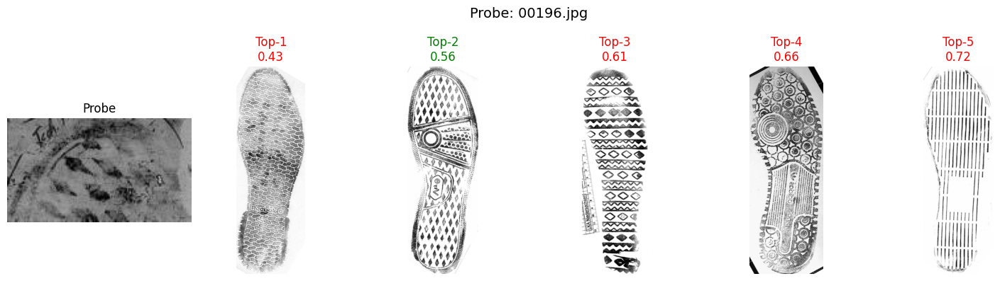

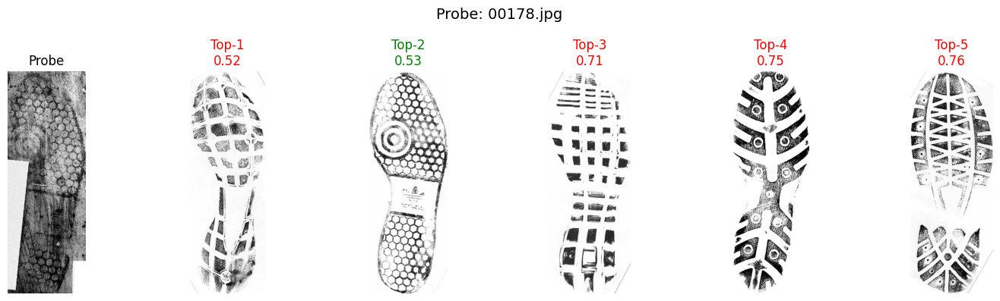

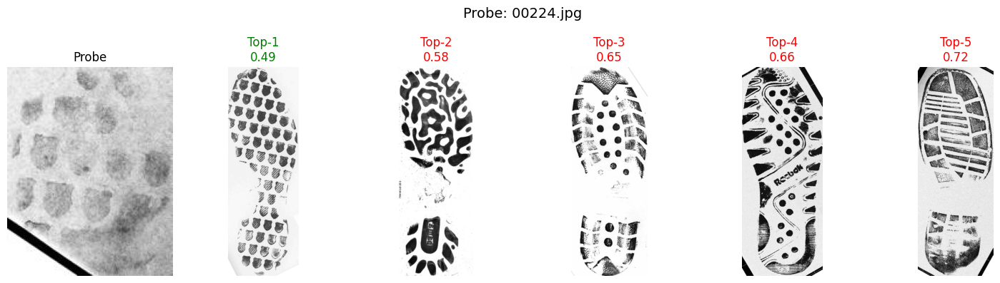

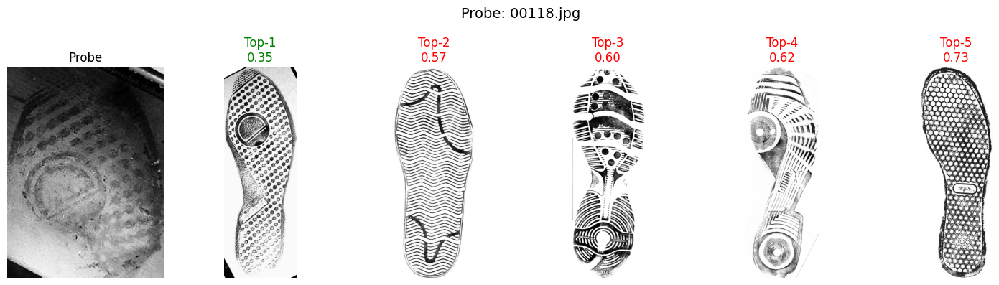

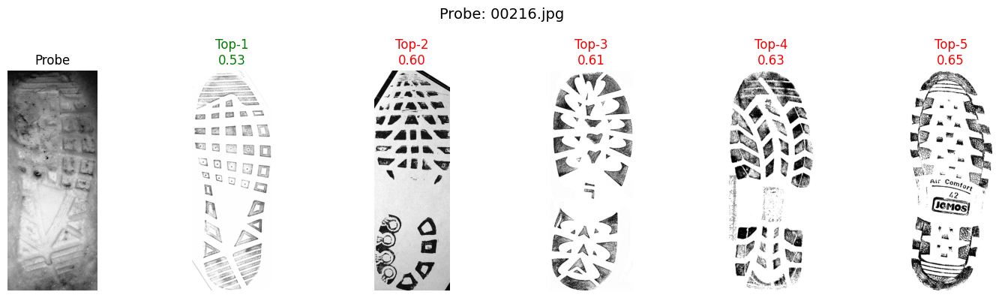

...

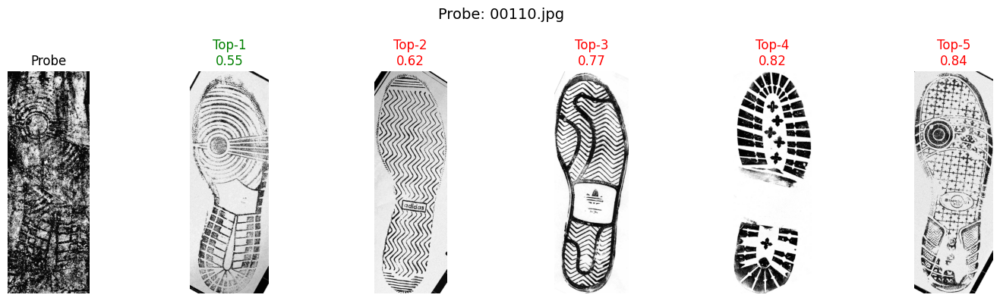

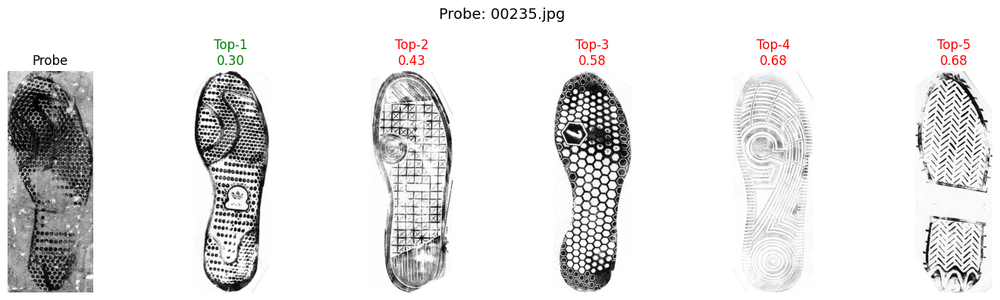

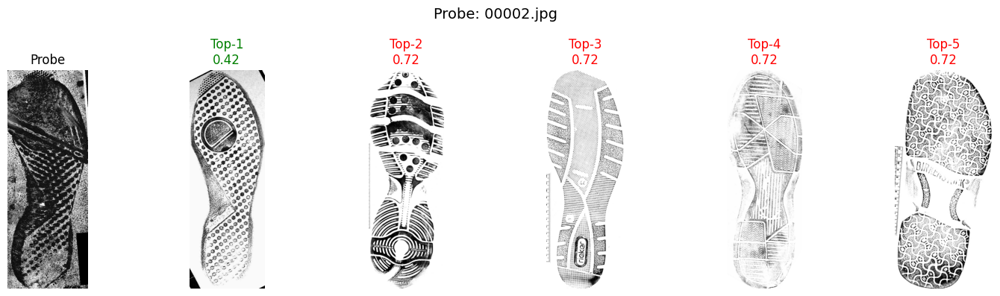

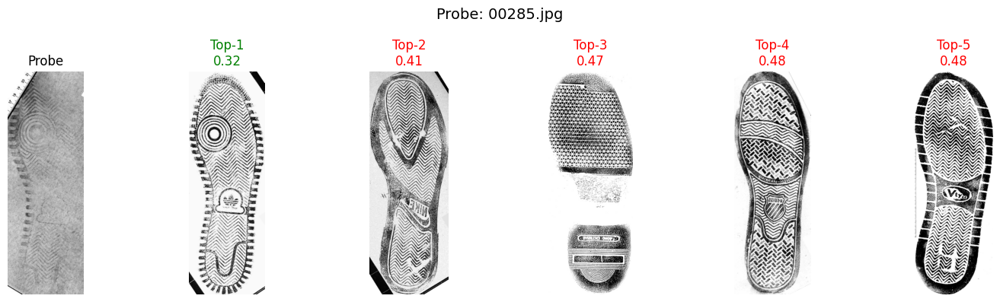

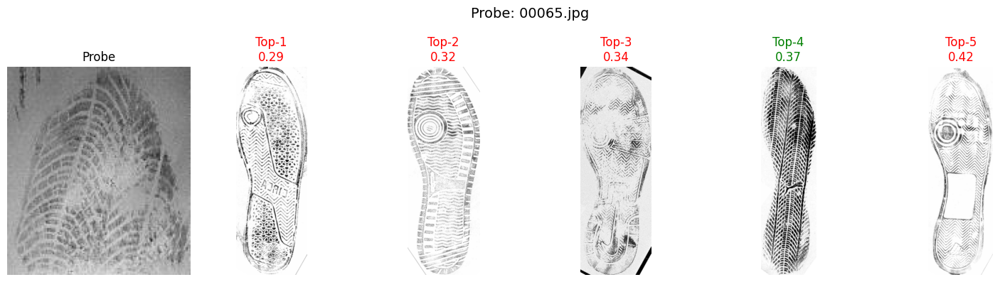

In [18]:
# بعد حساب النتائج:
for probe_path, top_k_results in results:
    probe_name = os.path.basename(probe_path)

    # 👇 فقط لو عندك Ground Truth file (اختياري)
    true_ref_path = None
    row = label_df[label_df['probe_name'] == probe_path]
    if not row.empty:
        true_ref_name = row.iloc[0]['reference_name']
        true_ref_path = true_ref_name



    show_top_k_matches(
        probe_path=probe_path,
        top_matches=top_k_results,
            true_ref_path=true_ref_path,
            title=f"Probe: {probe_name}"
    )

In [19]:
def test_single_probe(model, probe_path, references_dir, transform, device, k=5):
    model.eval()

    reference_paths = [os.path.join(references_dir, f) for f in os.listdir(references_dir)]

    # حمّل probe image
    probe_img = preprocess_image(probe_path)
    if probe_img is None:
        print("❌ Failed to load probe image.")
        return

    # Ensure probe_img is grayscale (has 1 channel)
    probe_img = probe_img.convert('L') # Convert to grayscale

    probe_tensor = transform(probe_img).unsqueeze(0).to(device)
    with torch.no_grad():
        probe_feat = model.forward_one(probe_tensor).cpu().numpy()

    results = []
    for ref_path in reference_paths:
        ref_img = preprocess_image(ref_path)
        if ref_img is None:
            print(f"❌ Failed to load reference image: {ref_path}")
            continue

        # Ensure ref_img is grayscale (has 1 channel)
        ref_img = ref_img.convert('L') # Convert to grayscale

        ref_tensor = transform(ref_img).unsqueeze(0).to(device)
        with torch.no_grad():
            ref_feat = model.forward_one(ref_tensor).cpu().numpy()

        distance = np.linalg.norm(probe_feat - ref_feat)
        results.append((ref_path, distance))

    results.sort(key=lambda x: x[1])  # sort by distance
    top_k = results[:k]

    print(f"\n✅ Top-{k} matches for Probe: {os.path.basename(probe_path)}")
    for i, (ref_path, dist) in enumerate(top_k):
        print(f"{i+1}. {os.path.basename(ref_path)} - Distance: {dist:.4f}")

    # Optional: Show matches
    # Pass the top_k results to show_top_k_matches
    show_top_k_matches(probe_path, top_k, true_ref_path=label_df["reference_name"][14]) # 🗸 Pass true_ref_path=None explicitly


    return top_k


✅ Top-5 matches for Probe: 00002.jpg
1. 00014.png - Distance: 0.4205
2. 00134.png - Distance: 0.7192
3. 00711.png - Distance: 0.7198
4. 00073.png - Distance: 0.7231
5. 00913.png - Distance: 0.7234


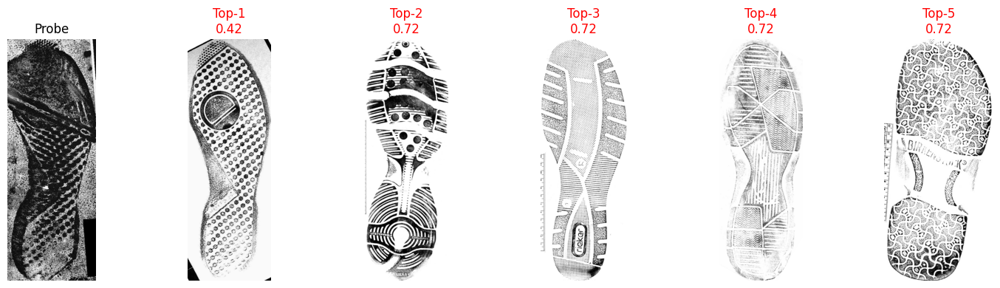

In [20]:
# Example usage
probe_path = "/content/FID-300/tracks_cropped/00002.jpg"  # صورة فردية للاختبار
top_k_results = test_single_probe(model, probe_path, REFERENCES_DIR, transform, device, k=5)
